<a href="https://colab.research.google.com/github/s331440/DAVE3625/blob/main/5900_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Read data

In [2]:
#Importing all the required libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.impute import KNNImputer

import statsmodels.api as sm
import statsmodels.formula.api as smf

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [34]:
# This dataset contains the unscaled variables instead of the scaled ones, the variables was scaled for the weekly datasets, this will impact the correlation between the variables for this dataset
Pac = pd.read_excel('/content/drive/MyDrive/Hias_onlinedata_88_9.xlsx', index_col=0, parse_dates=True)

In [35]:
Pac.head()

,O2_B4,O2_B5,O2_B6,O2_B8,O2_B9,Air_B4s,Air_B5s,Air_B6s,Air_B7s,Air_B8s,Air_B9s,Air_B10s,Water_ins,sCOD_ins,PO4_disk,Nox
Hias_onlinedata_variables1_dec2022[88],,,,,,,,,,,,,,,,
2022-12-01 11:00:00,6.4087,6.8414,6.5955,4.7831,4.5775,3.857323,1.838152,0.000000,1.068135,0.732095,0.524103,0.472836,0.109591,0.467088,NaN,NaN
2022-12-01 11:10:00,6.5375,6.7823,6.6090,4.7621,4.5435,3.866621,1.690377,1.560869,1.072318,0.736136,0.530234,0.469786,0.105549,0.465252,NaN,NaN
2022-12-01 11:20:00,6.5100,6.6385,6.6073,4.7642,4.5653,3.906998,1.653439,1.552350,1.058211,0.738972,0.522308,0.470218,0.108298,0.462211,NaN,NaN
2022-12-01 11:30:00,6.5377,6.6802,6.6271,4.7956,4.5588,3.939193,1.679874,1.558030,1.073969,0.741740,0.522579,0.466316,0.115149,0.455230,NaN,NaN
2022-12-01 11:40:00,6.4528,6.6716,6.6715,4.8471,4.5801,3.882547,1.669086,1.593727,1.063944,0.732270,0.524090,0.465158,0.121117,0.457443,NaN,NaN


In [36]:
imputer = KNNImputer(n_neighbors=3) 
Pac[['O2_B4']] = imputer.fit_transform(Pac[['O2_B4']])
Pac[['O2_B5']] = imputer.fit_transform(Pac[['O2_B5']])
Pac[['O2_B6']] = imputer.fit_transform(Pac[['O2_B6']])
Pac[['O2_B8']] = imputer.fit_transform(Pac[['O2_B8']])
Pac[['O2_B9']] = imputer.fit_transform(Pac[['O2_B9']])
Pac[['Air_B4s']] = imputer.fit_transform(Pac[['Air_B4s']])
Pac[['Air_B5s']] = imputer.fit_transform(Pac[['Air_B5s']])
Pac[['Air_B6s']] = imputer.fit_transform(Pac[['Air_B6s']])
Pac[['Air_B7s']] = imputer.fit_transform(Pac[['Air_B7s']])
Pac[['Air_B8s']] = imputer.fit_transform(Pac[['Air_B8s']])
Pac[['Air_B9s']] = imputer.fit_transform(Pac[['Air_B9s']])
Pac[['Air_B10s']] = imputer.fit_transform(Pac[['Air_B10s']])
Pac[['Water_ins']] = imputer.fit_transform(Pac[['Water_ins']])
Pac[['sCOD_ins']] = imputer.fit_transform(Pac[['sCOD_ins']])
Pac[['PO4_disk']] = imputer.fit_transform(Pac[['PO4_disk']])
Pac[['Nox']] = imputer.fit_transform(Pac[['Nox']])

In [ ]:
!pip install pydrive

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [37]:
data = Pac
Pac = pd.DataFrame(data)
Pac.to_excel('/content/drive/MyDrive/Hias_onlinedata_88_8.xlsx', index=False)

In [38]:
Pac.tail()

,O2_B4,O2_B5,O2_B6,O2_B8,O2_B9,Air_B4s,Air_B5s,Air_B6s,Air_B7s,Air_B8s,Air_B9s,Air_B10s,Water_ins,sCOD_ins,PO4_disk,Nox
Hias_onlinedata_variables1_dec2022[88],,,,,,,,,,,,,,,,
2022-12-31 23:10:00,4.2753,4.4922,3.7810,4.8697,5.1582,1.513735,0.838045,0.555937,0.706546,0.595885,0.511618,0.546989,0.069665,0.284402,0.0960,0.9320
2022-12-31 23:20:00,3.9971,4.4560,3.7526,4.9014,5.1804,1.476601,0.843370,0.507611,0.708256,0.596989,0.507570,0.542559,0.081278,0.284592,0.1070,0.9922
2022-12-31 23:30:00,3.8492,4.3334,3.3821,4.8762,5.1772,1.471597,0.823949,0.466286,0.691859,0.585236,0.502552,0.531572,0.088586,0.286291,0.1009,1.0511
2022-12-31 23:40:00,4.0244,4.2681,3.5222,4.8138,5.1253,1.891787,0.801879,0.597162,0.680187,0.573646,0.485434,0.510818,0.093149,0.291453,0.1048,1.1125
2022-12-31 23:50:00,4.7450,4.2643,4.1692,4.7192,5.0438,2.151868,0.778034,0.814750,0.674711,0.571486,0.482001,0.507768,0.088574,0.304807,0.1186,1.1792


In [39]:
cormap = Pac.corr()

In [40]:
cormap

,O2_B4,O2_B5,O2_B6,O2_B8,O2_B9,Air_B4s,Air_B5s,Air_B6s,Air_B7s,Air_B8s,Air_B9s,Air_B10s,Water_ins,sCOD_ins,PO4_disk,Nox
O2_B4,1.000000,0.673752,0.778881,-0.298052,-0.412306,0.785411,0.413326,0.596519,0.096778,0.010711,-0.185765,-0.255063,0.473044,0.333425,0.040116,0.392780
O2_B5,0.673752,1.000000,0.878807,0.054747,-0.016953,0.655937,0.795511,0.718042,0.363611,0.312861,0.232975,-0.226394,0.429115,0.443493,0.194482,0.431033
O2_B6,0.778881,0.878807,1.000000,-0.057851,-0.159152,0.772959,0.723436,0.861272,0.340030,0.295744,0.109949,-0.186351,0.547985,0.477430,0.177522,0.472621
O2_B8,-0.298052,0.054747,-0.057851,1.000000,0.922743,-0.257421,-0.021379,-0.104418,0.411709,0.603071,0.643102,0.481587,-0.113312,0.067519,0.034248,-0.004605
O2_B9,-0.412306,-0.016953,-0.159152,0.922743,1.000000,-0.328432,-0.073401,-0.202935,0.319923,0.522037,0.738625,0.488128,-0.137667,-0.001809,-0.008708,-0.074767
Air_B4s,0.785411,0.655937,0.772959,-0.257421,-0.328432,1.000000,0.661630,0.815684,0.427882,0.338080,0.138131,-0.014753,0.686535,0.408031,0.105161,0.354019
Air_B5s,0.413326,0.795511,0.723436,-0.021379,-0.073401,0.661630,1.000000,0.864936,0.602389,0.507515,0.381940,-0.008496,0.535869,0.466208,0.248390,0.388632
Air_B6s,0.596519,0.718042,0.861272,-0.104418,-0.202935,0.815684,0.864936,1.000000,0.537898,0.479331,0.235678,-0.004017,0.624720,0.513217,0.226724,0.429576
Air_B7s,0.096778,0.363611,0.340030,0.411709,0.319923,0.427882,0.602389,0.537898,1.000000,0.832388,0.690492,0.438333,0.433730,0.312514,0.060053,0.152096
Air_B8s,0.010711,0.312861,0.295744,0.603071,0.522037,0.338080,0.507515,0.479331,0.832388,1.000000,0.844790,0.567684,0.402336,0.348479,0.192607,0.222996


In [41]:
corr_matrix = Pac.corr()

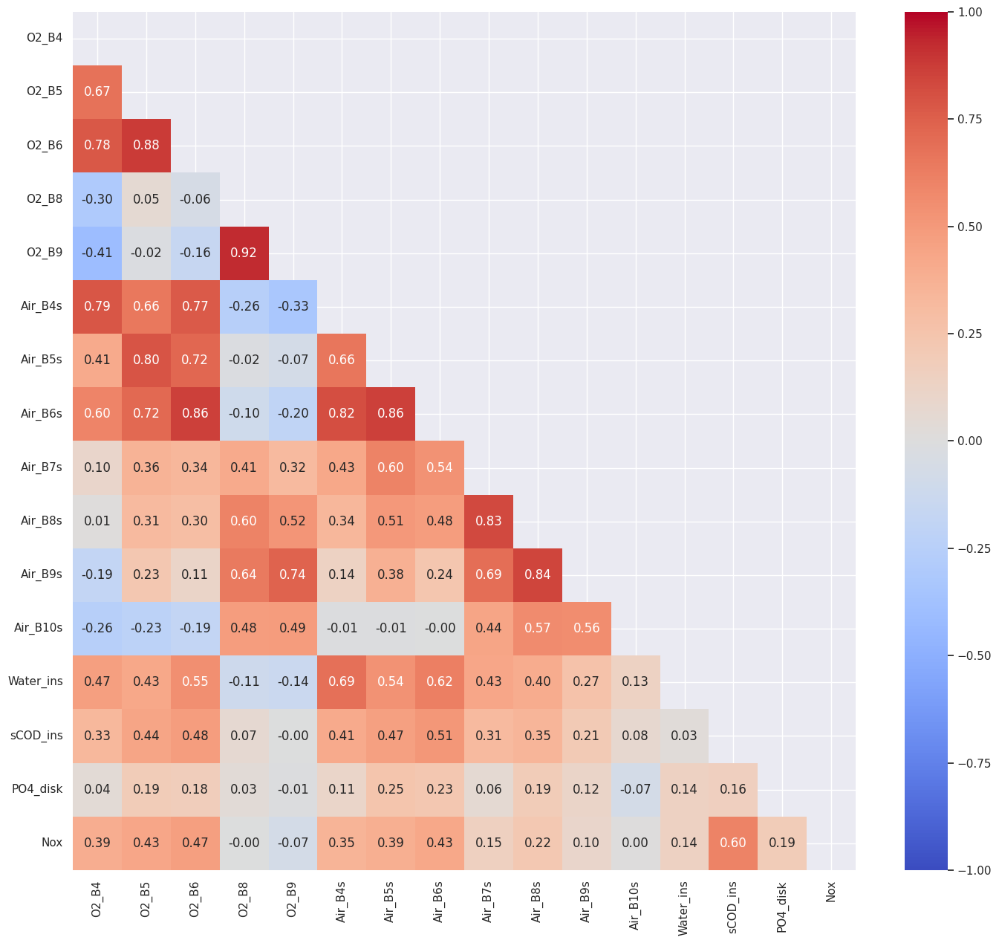

In [42]:
# Create correlation matrix
corr_matrix = Pac.corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.set(font_scale=1)

plt.figure(figsize=(17, 15))

sns.heatmap(corr_matrix, cmap='coolwarm', center=0, vmin=-1, vmax=1, mask=mask, annot=True, fmt='.2f')

plt.show()

<Figure size 30x30 with 0 Axes>

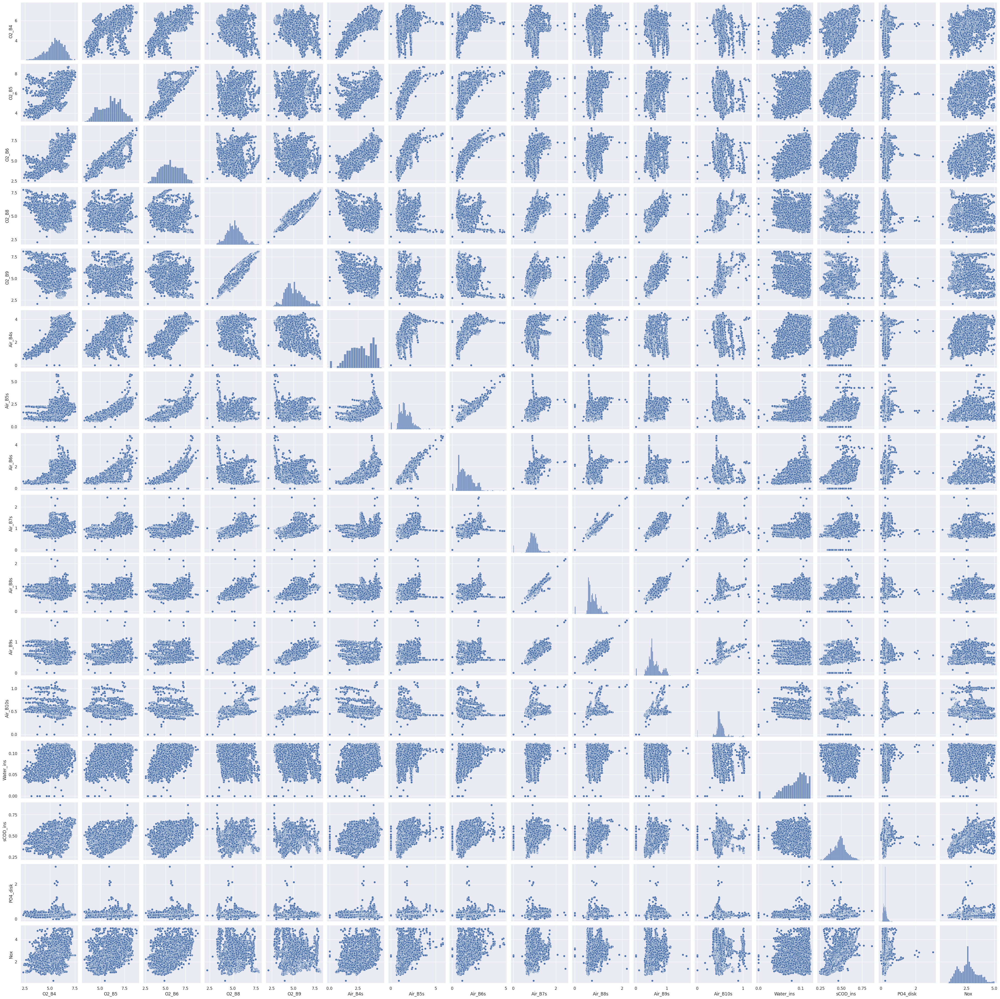

<Figure size 30x30 with 0 Axes>

In [43]:
sns.pairplot(Pac)

sns.set(font_scale=2)

plt.figure(figsize=(0.3, 0.3))

In [44]:
Pac1 = pd.read_excel('/content/drive/MyDrive/Hias_onlinedata_w51.xlsx', index_col=0, parse_dates=True)

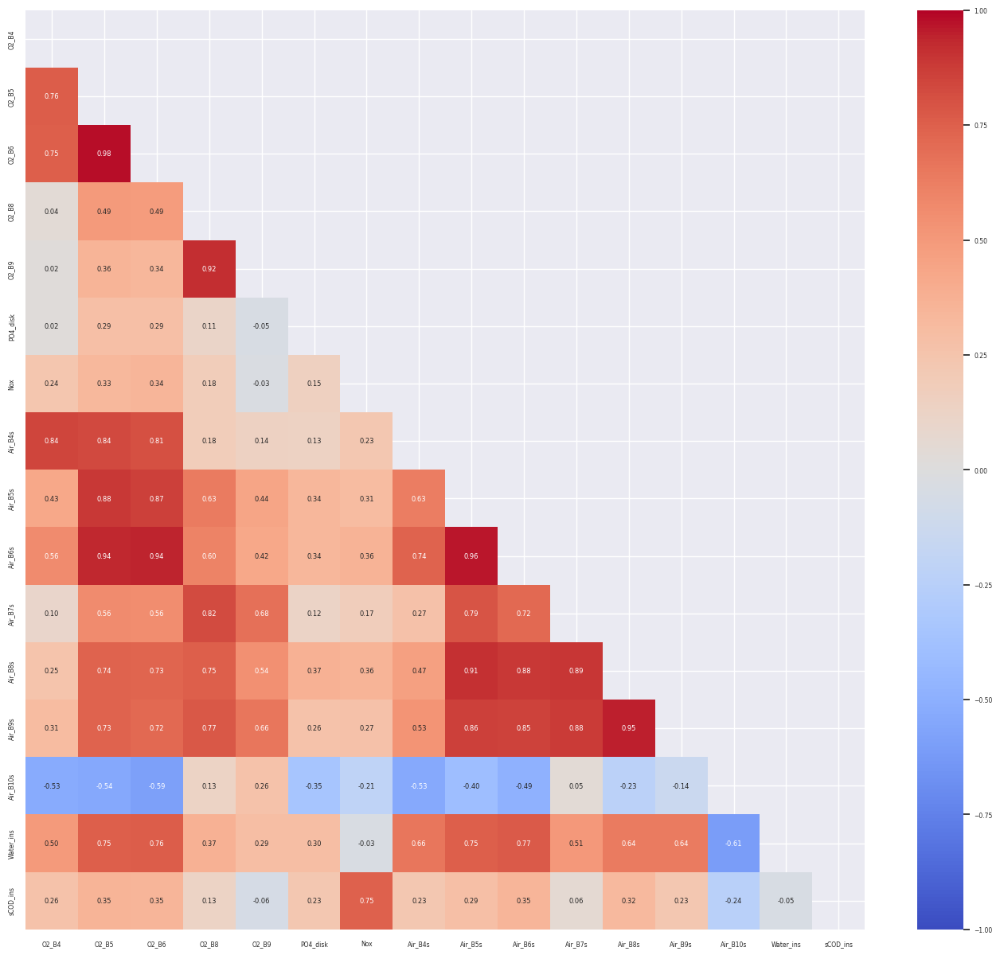

In [45]:
# Create correlation matrix
corr_matrix = Pac1.corr()

mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

sns.set(font_scale=0.5)

plt.figure(figsize=(17, 15))

sns.heatmap(corr_matrix, cmap='coolwarm', center=0, vmin=-1, vmax=1, mask=mask, annot=True, fmt='.2f')

plt.show()

<Figure size 50x50 with 0 Axes>

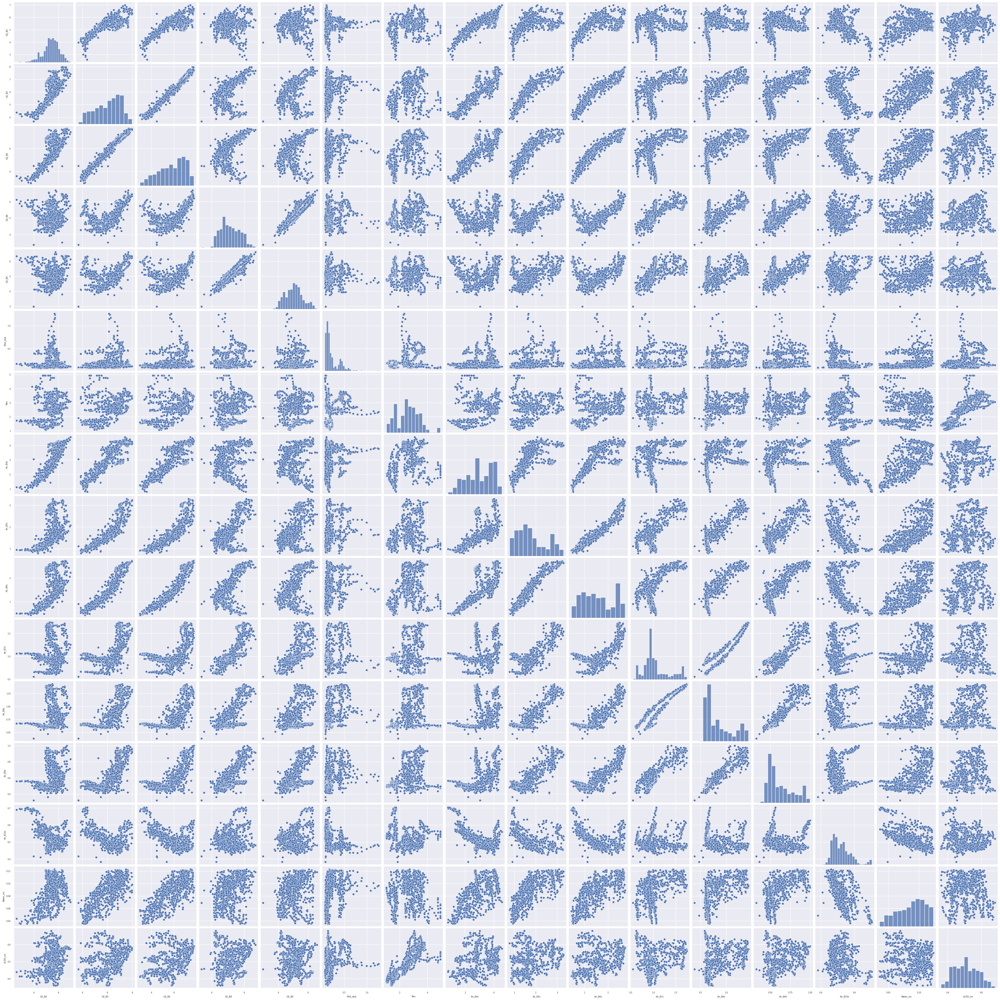

<Figure size 50x50 with 0 Axes>

In [46]:
sns.pairplot(Pac1)

sns.set(font_scale=1.5)

plt.figure(figsize=(0.5, 0.5))

In [47]:
Pac.isnull().sum()

O2_B4        0
O2_B5        0
O2_B6        0
O2_B8        0
O2_B9        0
Air_B4s      0
Air_B5s      0
Air_B6s      0
Air_B7s      0
Air_B8s      0
Air_B9s      0
Air_B10s     0
Water_ins    0
sCOD_ins     0
PO4_disk     0
Nox          0
dtype: int64

In [48]:
Pac1.isnull().sum()

O2_B4        0
O2_B5        0
O2_B6        0
O2_B8        0
O2_B9        0
PO4_disk     0
Nox          0
Air_B4s      0
Air_B5s      0
Air_B6s      0
Air_B7s      0
Air_B8s      0
Air_B9s      0
Air_B10s     0
Water_ins    0
sCOD_ins     0
dtype: int64

In [49]:
Pac.shape

(4398, 16)

In [50]:
Pac1.shape

(817, 16)

In [51]:
Pac.dtypes

O2_B4        float64
O2_B5        float64
O2_B6        float64
O2_B8        float64
O2_B9        float64
Air_B4s      float64
Air_B5s      float64
Air_B6s      float64
Air_B7s      float64
Air_B8s      float64
Air_B9s      float64
Air_B10s     float64
Water_ins    float64
sCOD_ins     float64
PO4_disk     float64
Nox          float64
dtype: object

In [52]:
Pac1.dtypes

O2_B4        float64
O2_B5        float64
O2_B6        float64
O2_B8        float64
O2_B9        float64
PO4_disk     float64
Nox          float64
Air_B4s      float64
Air_B5s      float64
Air_B6s      float64
Air_B7s      float64
Air_B8s      float64
Air_B9s      float64
Air_B10s     float64
Water_ins    float64
sCOD_ins     float64
dtype: object

### Acessing data


In [53]:
Pac.columns

Index(['O2_B4', 'O2_B5', 'O2_B6', 'O2_B8', 'O2_B9', 'Air_B4s', 'Air_B5s',
       'Air_B6s', 'Air_B7s', 'Air_B8s', 'Air_B9s', 'Air_B10s', 'Water_ins',
       'sCOD_ins', 'PO4_disk', 'Nox'],
      dtype='object')

In [54]:
Pac1.columns

Index(['O2_B4', 'O2_B5', 'O2_B6', 'O2_B8', 'O2_B9', 'PO4_disk', 'Nox',
       'Air_B4s', 'Air_B5s', 'Air_B6s', 'Air_B7s', 'Air_B8s', 'Air_B9s',
       'Air_B10s', 'Water_ins', 'sCOD_ins'],
      dtype='object')

In [56]:
Pac.describe(include='all')

,O2_B4,O2_B5,O2_B6,O2_B8,O2_B9,Air_B4s,Air_B5s,Air_B6s,Air_B7s,Air_B8s,Air_B9s,Air_B10s,Water_ins,sCOD_ins,PO4_disk,Nox
count,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000,4398.000000
mean,5.440306,6.060516,5.616508,5.178858,5.139662,2.692469,1.634136,1.285099,0.927522,0.762207,0.583197,0.510605,0.086760,0.478922,0.234813,2.583510
std,0.912926,1.077866,1.232681,0.823042,1.092127,1.019881,0.692578,0.669741,0.241322,0.229086,0.202732,0.137543,0.025981,0.081955,0.127500,0.844386
min,2.320100,3.385800,2.525800,2.210800,2.074000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.243753,0.000000,0.315300
25%,4.933000,5.219700,4.681350,4.641025,4.354150,1.925659,1.140221,0.759596,0.816068,0.613616,0.469050,0.460482,0.069651,0.425664,0.159000,1.926225
50%,5.534750,6.150550,5.616508,5.168000,5.048550,2.728852,1.538048,1.164853,0.922292,0.731330,0.537473,0.491978,0.092712,0.483283,0.234813,2.583510
75%,6.101100,6.889775,6.583750,5.688375,5.812425,3.640684,2.062258,1.697480,1.038423,0.889230,0.687244,0.546860,0.107067,0.527502,0.270675,3.085750
max,7.539800,8.732600,9.045700,7.828500,8.139200,4.571387,5.798712,4.836541,2.447981,2.193888,1.691128,1.140622,0.123244,0.864801,2.998300,5.000000


In [55]:
Pac1.describe(include='all')

,O2_B4,O2_B5,O2_B6,O2_B8,O2_B9,PO4_disk,Nox,Air_B4s,Air_B5s,Air_B6s,Air_B7s,Air_B8s,Air_B9s,Air_B10s,Water_ins,sCOD_ins
count,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000,817.000000
mean,5.372921,6.062231,5.806997,5.138671,5.049255,0.232548,2.608852,2.997965,1.819343,1.571538,1.054961,0.846249,0.623869,0.521427,0.087044,0.508848
std,0.673289,1.004960,1.157942,0.587463,0.586749,0.168701,0.812689,0.906492,0.663444,0.652700,0.285554,0.264331,0.156578,0.056461,0.022175,0.070021
min,2.591100,3.671600,2.983700,3.380100,2.984600,0.075200,1.050200,0.802662,0.783650,0.432977,0.550199,0.382921,0.321518,0.382200,0.035506,0.360855
25%,5.027000,5.280500,4.930300,4.693000,4.632600,0.123200,1.854700,2.282299,1.305737,1.001797,0.890253,0.632391,0.496720,0.479623,0.070335,0.451356
50%,5.432900,6.231700,5.941800,5.097500,5.057400,0.163800,2.598000,2.961272,1.655902,1.492240,0.963562,0.728619,0.561994,0.511303,0.090424,0.505075
75%,5.825600,6.889100,6.773100,5.599300,5.405200,0.293900,3.150600,3.812534,2.316098,2.226543,1.177870,1.024159,0.732728,0.549649,0.105014,0.560966
max,6.973300,7.992100,7.740400,6.688300,6.609300,1.258500,4.936700,4.571387,3.293783,2.737457,1.744620,1.429485,0.997880,0.703555,0.122920,0.680464
